In [1]:
import datetime

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from trout.files.reference_log_file import ReferenceLogFile
from trout.stars import Star

In [2]:
f = ReferenceLogFile.get_ref_revised_71()

In [3]:
VARIABLE_AND_PROBLEM_STARS = [ 1, 16, 41, 69, 82, 100, 115, 138, 166, 168, 195, 245, 255, 281, 285, 294, 317, 332, 338, 356, 357, 366, 377, 410, 414, 441, 465, 466, 504, 533, 539, 592, 597, 600, 628, 635, 664, 672, 685, 697, 703, 722, 736, 753, 755, 777, 788, 790, 814, 824, 842, 850, 852, 870, 877, 879, 888, 892, 904, 908, 912, 929, 950, 958, 981, 1007, 1048, 1052, 1054, 1065, 1103, 1113, 1131, 1143, 1144, 1191, 1195, 1197, 1219, 1223, 1276, 1369, 1426, 1475, 1495, 1529, 1539, 1654, 1687, 1693, 1702, 1716, 1843, 1856, 1873, 1887, 2237, 2251, 2252, 2502, 2509, 2510, ]

FROM_YEAR=2011
TO_YEAR=2012

ATT_THRESHOLD = 0.5 # We don't include stars < this att when fitting step curve

In [5]:
def handle_stars(stars, step_factors):
    stars_x = {}
    stars_steps = {}
    for star_no in stars:
        # Ignore variable and problem stars
        if star_no in VARIABLE_AND_PROBLEM_STARS:
            continue
        star = Star(star_no)
        # Ignore low attendance stars
        if (star.attendance(FROM_YEAR) < ATT_THRESHOLD
            or star.attendance(TO_YEAR) < ATT_THRESHOLD):
            continue
        stars_x[star_no] = f.get_star_xy(star_no)[0]
        stars_steps[star_no] = star.step(FROM_YEAR, TO_YEAR)
        
    star_numbers = sorted(stars_x.keys())
    ordered_x_values = [stars_x[star_no] for star_no in star_numbers]
    ordered_y_values = [stars_steps[star_no] for star_no in star_numbers]


    plt.scatter(ordered_x_values, ordered_y_values)
    
    # Draw a 2nd degree fit
    fit_fn = np.poly1d(np.polyfit(ordered_x_values, ordered_y_values, 2))
    
    # Generate enough data points to draw a line
    x_line = np.arange(min(ordered_x_values), max(ordered_x_values), 1)
    y_line = [fit_fn(x) for x in x_line]
    plt.plot(x_line, y_line, '--', color='red')
    
    plt.xlabel("x_coordinate")
    plt.ylabel("step ratio")
    plt.title(f"Steps: {stars[0]} - {stars[-1]}. {FROM_YEAR}-{TO_YEAR}")
    plt.show()
    
    # Save the step factor for the star
    for star_no in stars:
        star_x = f.get_star_xy(star_no)[0]
        step_factors[star_no] = fit_fn(star_x)
        

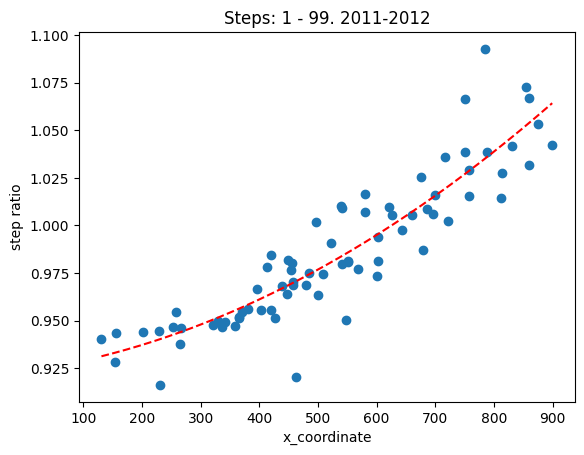

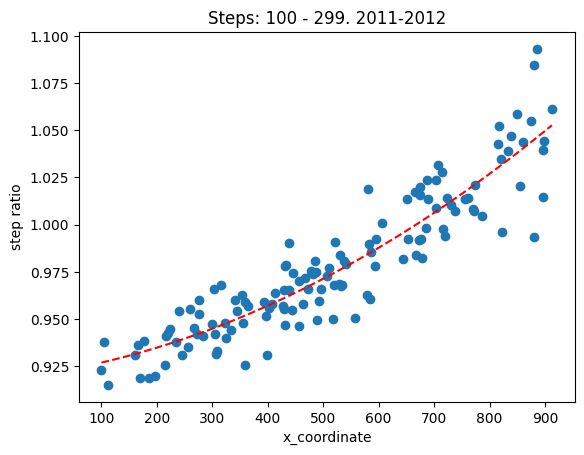

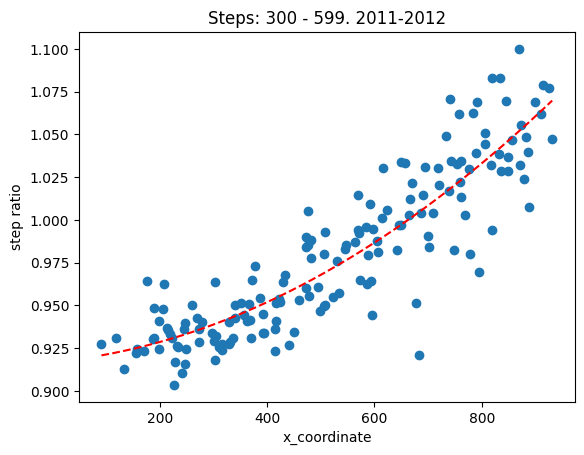

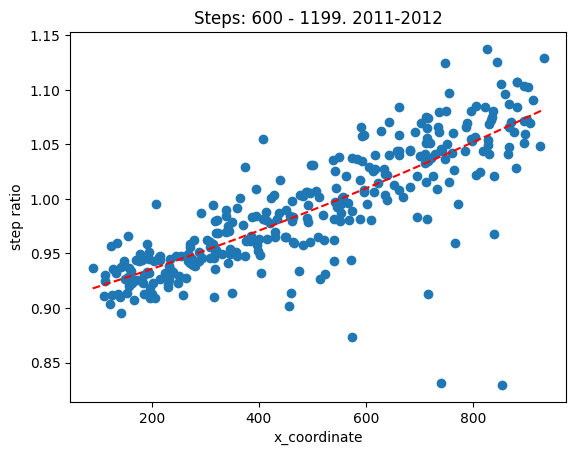

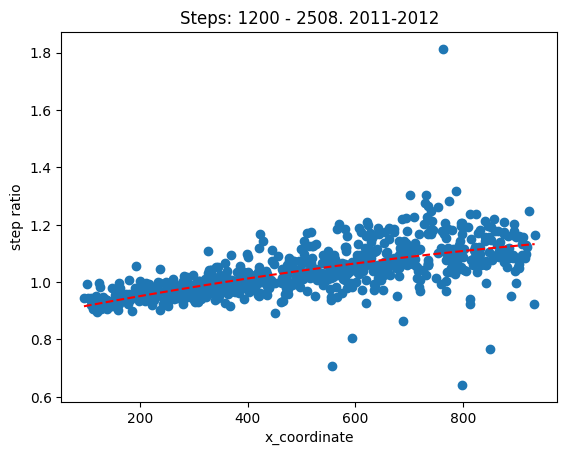

In [7]:
star_steps = {}
for stars in [range(1, 100), range(100, 300), range(300, 600), range(600, 1200), range(1200, 2509)]:
    handle_stars(stars, star_steps)

In [108]:
def apply_step_and_plot(star_no, step_factors, apply_step=True):
    star = Star(star_no)
    step = step_factors[star_no]
    
    star.select('') # select all data
  
    # Apply the transformation
    def transform(data):
        sn, flux, date = data
        if date < datetime.date(2012, 1, 1):
            return flux * step
        else:
            return flux
    if apply_step:
        star.transform_selected(transform)
        star.plot(title=f"Star - {star_no}. Step applied")
    else:
        star.plot()

## The step factors table, and JSON are at the end of the page

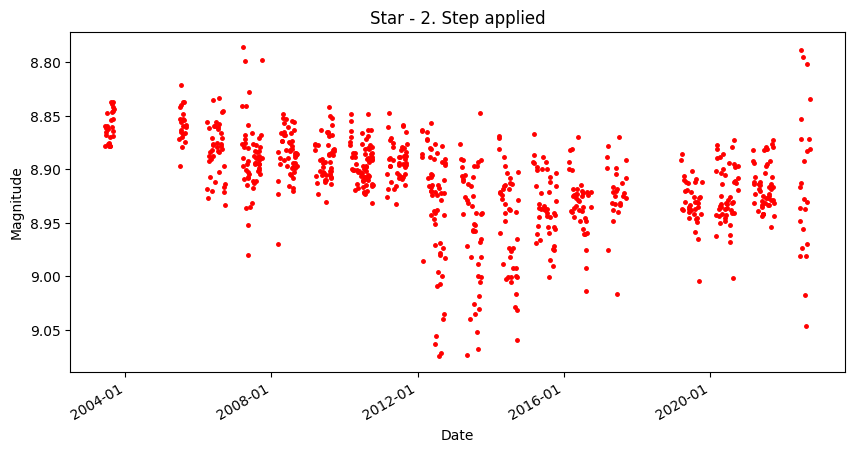

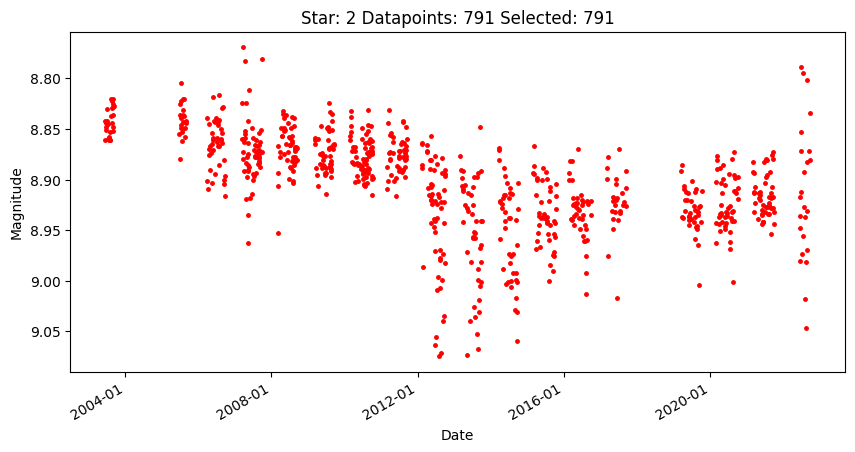

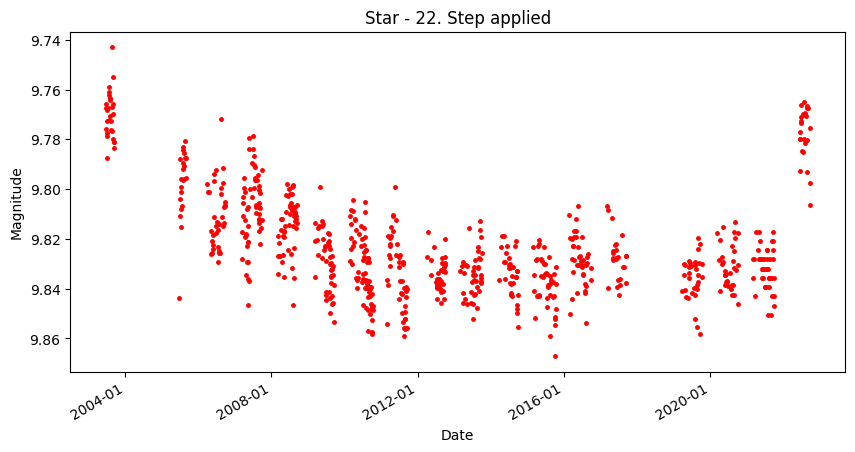

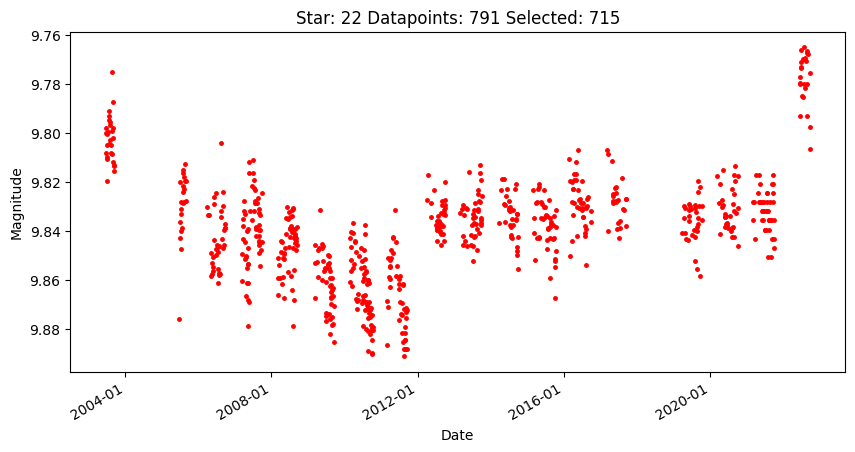

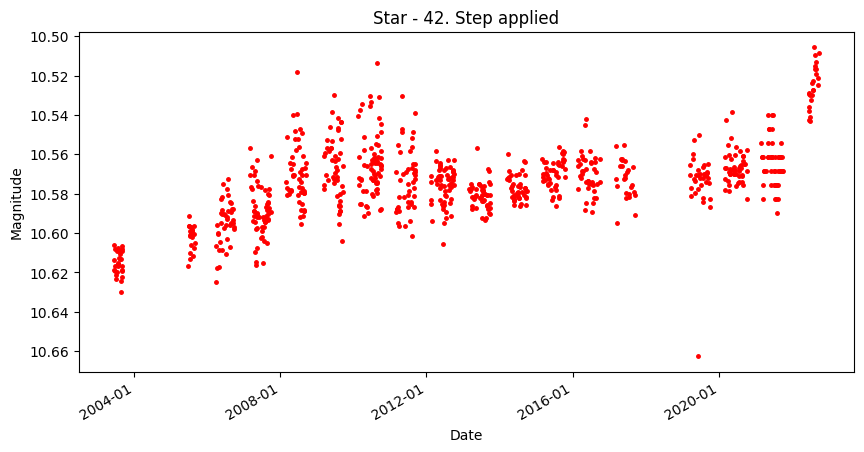

...

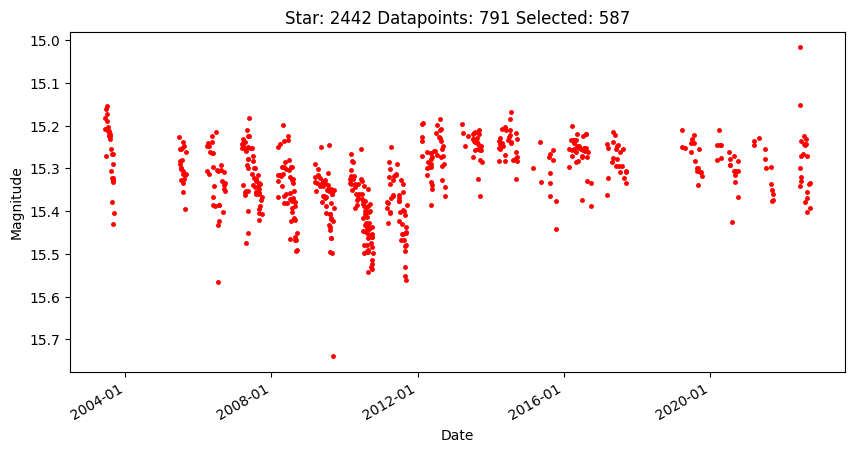

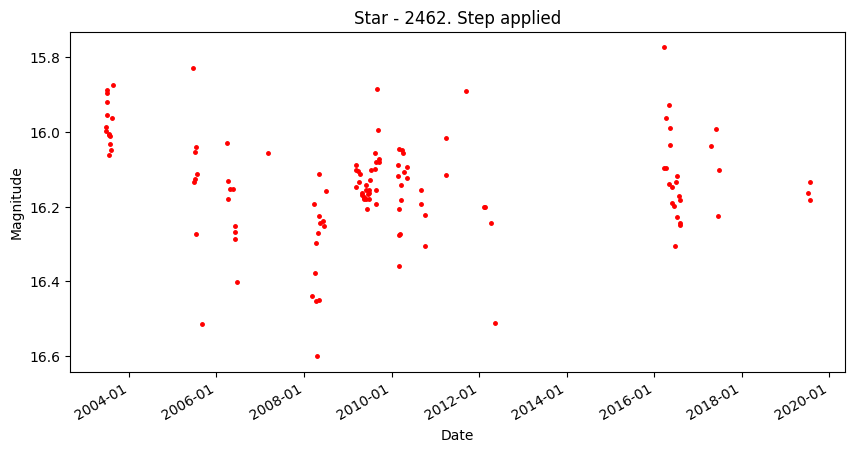

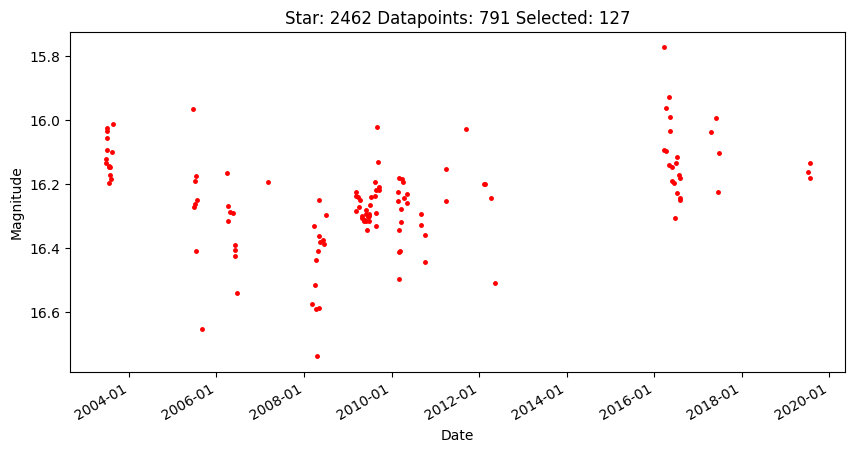

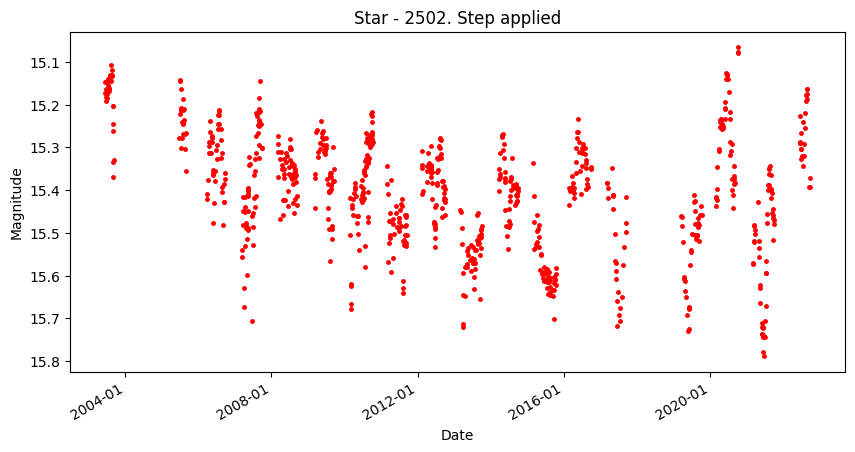

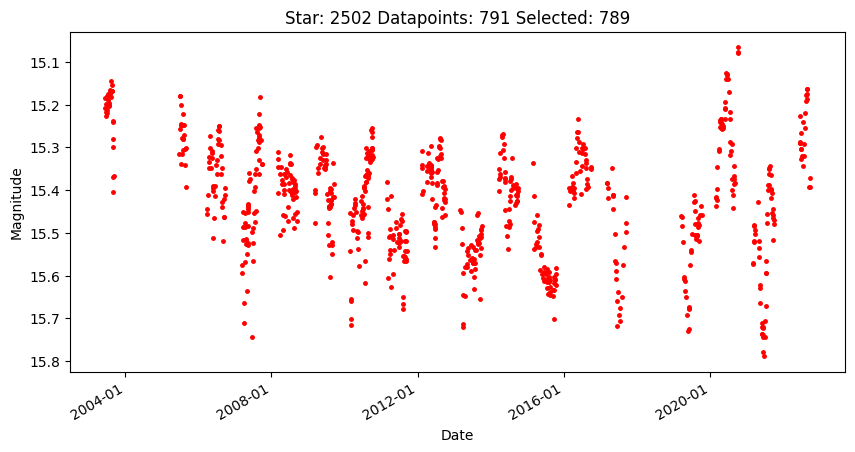

In [114]:
for star in range(2, 2505, 20):
    selected_stars.append(star)
    apply_step_and_plot(star, star_steps)
    apply_step_and_plot(star, star_steps, False)

In [119]:
# Table
print(f"{'Star':<10s}{'Step':<10s}")
for star in range(1, 2509):
    print(f"{star:<10d}{star_steps[star]:<10.5f}")

Star      Step      
1         1.02610   
2         0.98512   
3         0.97058   
4         0.94022   
5         0.92983   
6         0.93305   
7         1.08044   
8         0.97690   
9         0.98569   
10        0.95684   
11        0.99112   
12        0.97333   
13        0.95245   
14        0.99235   
15        0.95633   
16        1.01584   
17        0.99123   
18        0.96979   
19        0.92780   
20        1.09356   
21        0.95314   
22        1.02873   
23        1.01045   
24        0.96823   
25        0.98367   
26        0.95543   
27        1.05389   
28        0.97619   
29        0.99920   
30        1.07066   
31        0.96918   
32        0.93742   
33        1.02693   
34        0.96308   
35        1.00362   
36        0.94304   
37        0.94410   
38        0.94387   
39        0.96845   
40        1.04214   
41        0.96266   
42        0.95830   
43        1.03504   
44        0.97428   
45        0.96414   
46        0.96683   
47        1.0

In [9]:
# JSON
str(star_steps)

'{1: 1.026102200856772, 2: 0.9851169911786012, 3: 0.9705847020192118, 4: 0.9402243869885875, 5: 0.9298348517002746, 6: 0.9330484717202518, 7: 1.0804362188644254, 8: 0.9769032176261113, 9: 0.9856889606134454, 10: 0.9568421274293198, 11: 0.9911236908041094, 12: 0.9733322416103934, 13: 0.9524490478443228, 14: 0.9923495630351107, 15: 0.9563302911307442, 16: 1.0158429374920184, 17: 0.9912297127521069, 18: 0.9697894603368161, 19: 0.9278000028522476, 20: 1.0935608386129663, 21: 0.9531413007162861, 22: 1.0287297272686016, 23: 1.0104537206365825, 24: 0.9682300664458141, 25: 0.9836700924509972, 26: 0.9554325829844428, 27: 1.0538874013865716, 28: 0.9761900144829764, 29: 0.9992040317649282, 30: 1.0706590358359107, 31: 0.9691753979123463, 32: 0.9374173509212702, 33: 1.0269343522272523, 34: 0.9630809713911885, 35: 1.0036225653945965, 36: 0.9430396949979006, 37: 0.9440956454585805, 38: 0.9438722012078191, 39: 0.9684475399586204, 40: 1.0421426905343076, 41: 0.9626591167225202, 42: 0.9582966760564874, 